# Time-lapse Cameras and Snow Applications

:::{admonition} Learning Objectives

**At the conclusion of this tutorial, you will...:**
- Understand all the time-lapse images available from the 2017 and 2020 SnowEx field campaigns 
- View example time-lapse images from SnowEx 2020 and visualize their locations
- Access snow depth measurements extracted from the SnowEx 2020 time-lapse images 
- Compare snow depths from different time-lapse cameras 
:::

## Time-lapse Cameras on Grand Mesa during SnowEx Field Campaigns
Time-lapse cameras were installed in both the 2017 and 2020 SnowEx field campaigns on Grand Mesa in similar locations. 

**SnowEx 2017 Time-lapse Cameras** 
* 28 Total Time-lapse Cameras
* Capturing the entire winter season (September 2016-June 2017)
* Taking 4 photos/day at 8AM, 10AM, 12PM, 2PM, 4PM
* Time-lapse images have been submitted to the NSIDC with all the required metadata for use. 

**SnowEx 2020 Time-lapse Cameras**
* 30 Total Time-lapse Cameras
* Capturing the entire winter season (September 2019-May 2020)
* Taking 3 photos/day at 11AM, 12PM, 1PM
* Cameras were installed across a vegetation gradient on a scale 
    * 1 (least vegetation and ) to 9 (most vegetation)
    * Within each vegetation class, there were three sub-classes of snow depths
        * shallow, intermediate, and deep snow, that were derived from 2017 SnowEx lidar measurements. 
        
* *The complete set of time-lapse images from 2020 are in progress for submission to the NSIDC. A subset of them are available here for you to use during hackweek*

### Pulling and visualizing time-lapse photos

We will now pull time-lapse imagery for camera E9B from the SnowEx 2020 field campaign. We will pull images and display a sample from various times of the winter season.     

**First, import all the packages we'll need for this tutorial**

In [37]:
# Packages to connect and download from the SnowEx database 
import snowexsql.db # import SnowEx SQL library
from snowexsql.db import get_db # connection function from the snowexsql library
from snowexsql.data import PointData, SiteData # point and table classes 
from snowexsql.conversions import query_to_geopandas # function to convert incoming data from database to geopandas df

# Packages for data analysis 
import geopandas as gpd # geopandas library for data anaylsis and visualiztion
import pandas as pd # pandas as to read csv data and visualize tabular data
import numpy as np # numpy for data analysis 

# Packages for data visualiztion
import matplotlib.pyplot as plt # matplotlib.pyplot for plotting images and graphs
from IPython.display import Image # used to display images inside the notebook
import seaborn as sns # a module that adds some plotting capabilities 
import matplotlib as mpl # import all of matplotlib for plotting 

# The following settings just set some defaults for the plots in this notebook
sns.set() # activates some of the default settings from seaborn
sns.set_style("dark", {"xtick.bottom": True, 'ytick.left': True}) # improves x and y ticks 

plt.rcParams['figure.figsize']  = (10, 4) # figure size
plt.rcParams['axes.titlesize']  = 14 # title size 
plt.rcParams['axes.labelsize']  = 12 # axes label size 
plt.rcParams['xtick.labelsize'] = 11 # x tick label size 
plt.rcParams['ytick.labelsize'] = 11 # y tick label size 
plt.rcParams['legend.fontsize'] = 11 # legend size 
mpl.rcParams['figure.dpi'] = 100

**Download the sample datasets for this tutorial** \
For ease of access during the hackweek, sample files are available for download for running the command in the cell below.

In [1]:
!aws s3 sync --no-progress s3://snowex-data/tutorial-data/camera-trap/ /tmp/camera-trap ## pull in temporary data from AWS servor

download: s3://snowex-data/tutorial-data/camera-trap/Picture1.png to ../../../../../tmp/camera-trap/Picture1.png
download: s3://snowex-data/tutorial-data/camera-trap/WSCT0065.JPG to ../../../../../tmp/camera-trap/WSCT0065.JPG
download: s3://snowex-data/tutorial-data/camera-trap/WSCT0716.JPG to ../../../../../tmp/camera-trap/WSCT0716.JPG
download: s3://snowex-data/tutorial-data/camera-trap/WSCT0101.JPG to ../../../../../tmp/camera-trap/WSCT0101.JPG
download: s3://snowex-data/tutorial-data/camera-trap/WSCT0024.JPG to ../../../../../tmp/camera-trap/WSCT0024.JPG
download: s3://snowex-data/tutorial-data/camera-trap/WSCT0378.JPG to ../../../../../tmp/camera-trap/WSCT0378.JPG
download: s3://snowex-data/tutorial-data/camera-trap/WSCT0742.JPG to ../../../../../tmp/camera-trap/WSCT0742.JPG
download: s3://snowex-data/tutorial-data/camera-trap/WSCT0784.JPG to ../../../../../tmp/camera-trap/WSCT0784.JPG


:::{admonition} Important Note :class: hint

Remeber, this is a subset of sample images from SnowEx 2020 currently stored on SnowEx's temporary Amazon Web Service (AWS) server. The final images for SnowEx 2017 and 2020 will all be available on NSIDC. 
:::

**Now display an example time-lapse image inside the notebook**

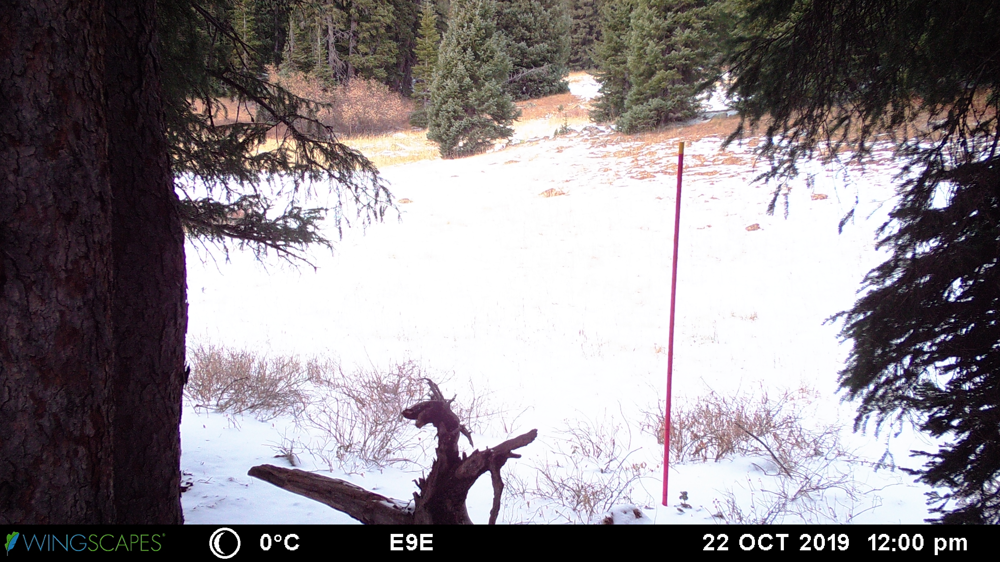

In [8]:
pil_img = Image(filename='/tmp/camera-trap/WSCT0101.JPG', width=600, height=300)
display(pil_img)

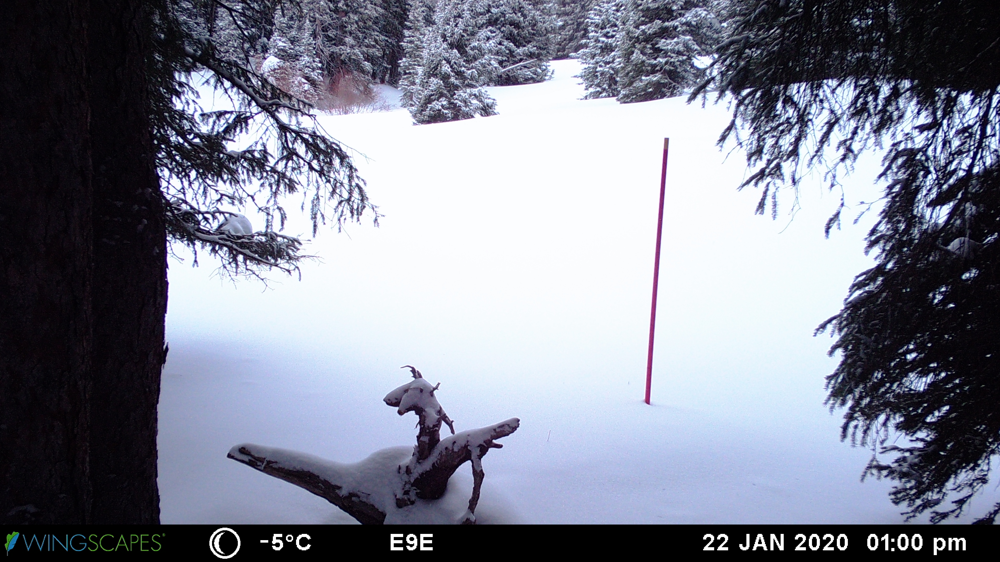

In [9]:
pil_img = Image(filename='/tmp/camera-trap/WSCT0378.JPG', width=600, height=300)
display(pil_img)

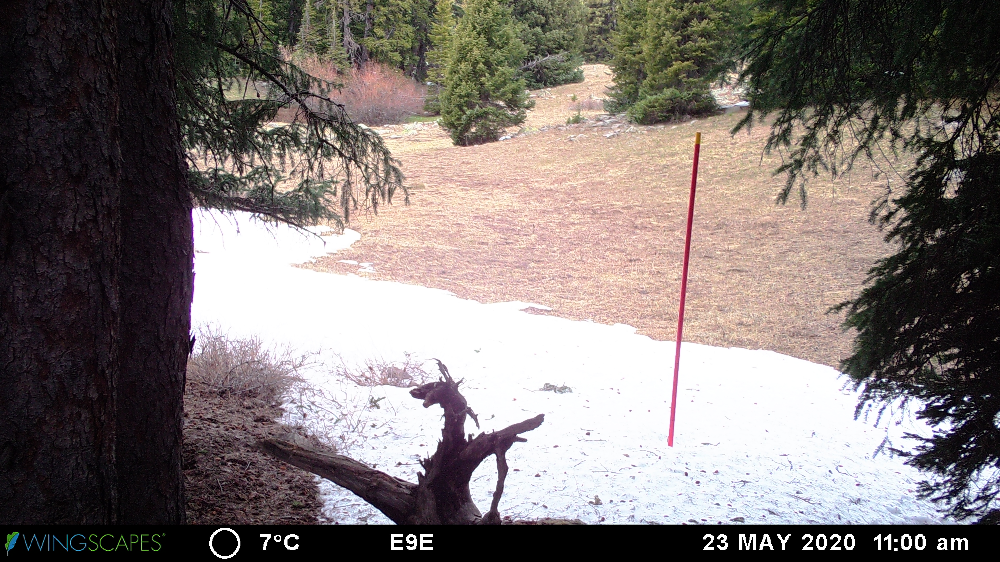

In [10]:
pil_img = Image(filename='/tmp/camera-trap/WSCT0742.JPG', width=600, height=300)
display(pil_img)

- What do you notice? Is this an open or closed canopy site? 
- Can you see the snow rising and falling on the pole? 
- What are some snow properties that you might be able to measure using these devices? 

## Time-lapse Camera Applications

### 1. Determine Snow Depth from Time-lapse Images

Installing snow poles in front of time-lapse camera provides low-cost, long-term snow depth timeseries. Snow depths from the 2020 SnowEx time-lapse imagery have been manually processed with estimation of submission to the NSIDC database in summer 2021 (*in progress* Breen et al. 2021). 

The snow depth is the difference between the number of pixels in a snow-free image and an image with snow, with a conversion from pixels to centimeters (see figure below).

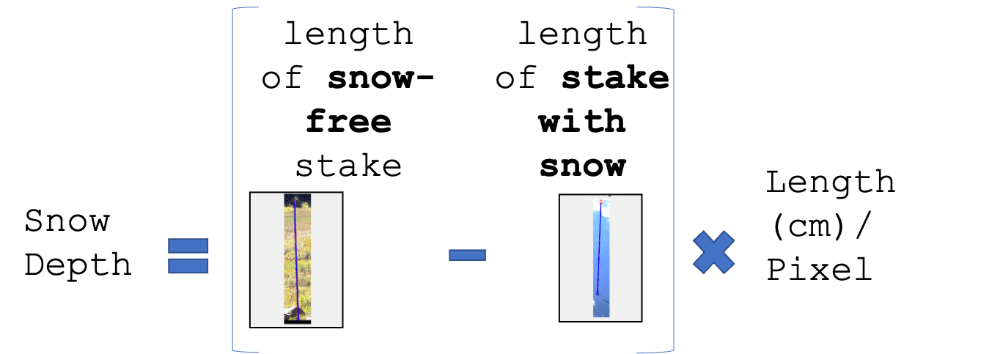

In [12]:
pil_img = Image(filename='/tmp/camera-trap/Picture1.png', width=800, height=500)
display(pil_img)

**Figure. 1 KATIE PUT A FIGURE CAPTION HERE TO EXPLAIN YOUR METHODS/FIGURE ~~~~~~~~~~~~~~~~~~~~~~**

Below we will explore the snow depth dataset created from this methodology. 

#### Step 1: Compare snow pit and time-lapse camera locations from SnowEx 2020
*code credit: Micah Johnson*

By pulling snow pit data from the database, we will compare the 2020 snow pit locations to the time-lapse camera locations on the Grand Mesa.

In [40]:
# Connect to the database
db_name = 'snow:hackweek@52.32.183.144/snowex'
engine, session = get_db(db_name)

# Grab all the point data that was that was measured with a time-lapse camera 
qry = session.query(PointData)
qry = qry.filter(PointData.instrument == 'camera-trap')

# Convert it to a geopandas df and visualize the dataframe
camera_depths = query_to_geopandas(qry, engine)
print(camera_depths.head())

    site_name        date                     time_created time_updated  \
0  Grand Mesa  2019-09-29 2021-06-26 11:25:38.509049+00:00         None   
1  Grand Mesa  2019-09-29 2021-06-26 11:25:38.516037+00:00         None   
2  Grand Mesa  2019-09-30 2021-06-26 11:25:38.518233+00:00         None   
3  Grand Mesa  2019-09-30 2021-06-26 11:25:38.520249+00:00         None   
4  Grand Mesa  2019-10-01 2021-06-26 11:25:38.522287+00:00         None   

        id site_id   doi date_accessed   instrument   type  ...   longitude  \
0  4145815    None  None    2021-06-26  camera-trap  depth  ... -108.184794   
1  4145816    None  None    2021-06-26  camera-trap  depth  ... -108.184794   
2  4145817    None  None    2021-06-26  camera-trap  depth  ... -108.184794   
3  4145818    None  None    2021-06-26  camera-trap  depth  ... -108.184794   
4  4145819    None  None    2021-06-26  camera-trap  depth  ... -108.184794   

       northing        easting  elevation  utm_zone  \
0  4.321444e+06  74

**Pull out the columns of interest to make it easier to visualize**

:::{admonition} Important Note :class: hint

'-6:00' in the *time* column indicates the UTC time zone.  
:::

In [41]:
camera_depths[['equipment','time','value']]

,equipment,time,value
0,camera id = W1B,11:00:00-06:00,0.00124
1,camera id = W1B,12:00:00-06:00,-4.49948
2,camera id = W1B,11:00:00-06:00,-2.99924
3,camera id = W1B,12:00:00-06:00,-4.49948
4,camera id = W1B,11:00:00-06:00,-5.99972
...,...,...,...
13366,camera id = E8A,13:00:00-06:00,47.26461
13367,camera id = E8A,11:00:00-06:00,51.76501
13368,camera id = E8A,12:00:00-06:00,50.86493
13369,camera id = E8A,13:00:00-06:00,49.96485


**Grab all the unique geometry objects (i.e., locations)**

In [19]:
qry = session.query(SiteData.geom).distinct()
pits = query_to_geopandas(qry, engine)
pits.head()

,geom
0,POINT (743040.000 4324967.000)
1,POINT (741378.000 4326992.000)
2,POINT (742531.000 4322632.000)
3,POINT (745093.000 4322617.000)
4,POINT (745477.000 4322480.000)


**And, print out how many of each we found** 

In [20]:
print(f'Found {len(camera_depths["geom"].unique())} camera trap locations')
print(f'Found {len(pits.index)} pit site locations')

# End our database session to avoid hanging transactions
session.close()

Found 28 camera trap locations
Found 155 pit site locations


#### Step 2: Plot the snow pit and camera locations together. 

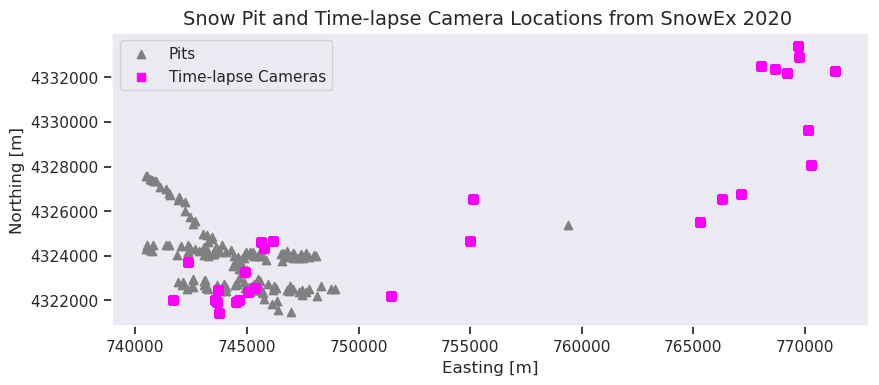

In [42]:
# plot the pits as triangles
ax = pits.plot(marker='^', color='gray', label='Pits')

# Plot the cameras as squares
ax = camera_depths.plot(ax=ax, color='magenta', marker='s', label='Time-lapse Cameras')

# Don't use scientific notation on the ticks for utm coords
ax.ticklabel_format(style='plain', useOffset=False)
ax.set_xlabel('Easting [m]')
ax.set_ylabel('Northing [m]')
ax.legend()

plt.title('Snow Pit and Time-lapse Camera Locations from SnowEx 2020 ')
plt.tight_layout()
plt.show()

- What do you notice? Is there overlap between the snow pit and camera trap locations?
- How might the two datasets be compared?

#### Step 3: Grab and Plot a Snow Depth created from a Vegetated and an Open Camera Site

In [43]:
# Grab the open site data from the db
open_site = 'W1A'
veg_site = 'W9A'
qry = session.query(PointData).filter(PointData.equipment.contains(open_site))
df_open = query_to_geopandas(qry,engine)

# Grab the vegetated site from the db
qry = session.query(PointData).filter(PointData.equipment.contains(veg_site))
df_veg = query_to_geopandas(qry,engine)

# Set the date as the index for easy plotting/reading
df_open = df_open.set_index('date')
df_veg = df_veg.set_index('date')

**Plot the snow depth from open and vegetated time-lapse camera sites together**

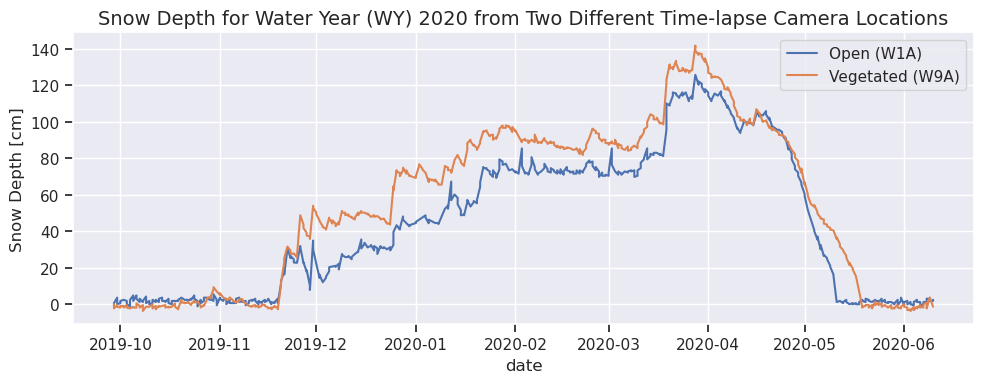

In [44]:
# Plot the 2 datasets by date
ax = df_open['value'].plot(label=f'Open ({open_site})')
df_veg['value'].plot(ax=ax, label=f'Vegetated ({veg_site})')

# Mess with some labeling to make it look nice
ax.legend()
ax.set_ylabel('Snow Depth [cm]')

plt.title('Snow Depth for Water Year (WY) 2020 from Two Different Time-lapse Camera Locations')
plt.tight_layout()
plt.grid()
plt.show()

Previous forest-snow research, such as *Dickerson-Lange et al. 2017* have used similar analysis to determine the snow disappearance timing in forested regions of the Pacific Northwest. Further research could use this dataset to explore the following, 

- What do you notice about the differences between the open and closed canopy site? 
- What might be some drawbacks to this method? 
- What would it look like to map and compare all the closed canopy sites to all the open canopy sites? 

## Time-lapse Camera Applications
### 2. Citizen Science Snow Classifications

Time-lapse photos from SnowEx 2017 were uploaded to a citizen science platform called Zooniverse (https://www.zooniverse.org/) and classified by thousands of volunteers as part of the *Snow Spotter* project (https://www.zooniverse.org/projects/mozerm/snow-spotter). Citizen scientists responded to questions about snow in the time-lapse photos, such as *"is there snow on the ground?"*, *"is there snow in the tree branches?"* and *"are there clouds in the sky?"*. These classifications are used to create a binary timeseries about snow conditions at the time-lapse camera sites on Grand Mesa for 2017. 

The 2020 images will be uploaded to *Snow Spotter* and classified as well.

## Current and Future Work
### Snow Depth

Automated methods to extract snow depth using the Hough Transform (Currier et al. 2017) have been used on this (*in progress* Breen et al. 2021). The available automated and manual codes are available on GitHub: https://github.com/catherine-m-breen/Snow-Depth-From-Snow-Stakes. 


### Project Ideas
- How else might you use these images to advance SnowEx and snow hydrology?


### **Thanks for attending this tutorial. We look forward to see what you will find in these datasets!**

Tutorial Authors 
- Catherine (Katie) Breen, cbreen@uw.edu
- Cassie Wells Lumbrazo, lumbraca@uw.edu

*Acknowledgements: Anthony Arendt, Scott Henderson, Carrie Vuyovich, Ryan Currier, Megan Mason, Micah Johhnson*




**References**

Dickerson-Lange et al. 2017. *Snow disappearance timing is dominated by forest effects on snow accumulation in warm winter climates of the Pacific Northwest, United States.* Hydrological Processes. Vol 31, Issue 10. 13 February 2017. https://doi.org/10.1002/hyp.11144